In [55]:
import math
import os
os.sys.path.append("../")
import re
from typing import Union

import anndata as ad
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import spatial, stats
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import AgglomerativeClustering
from tqdm import tqdm 
from scipy.io import mmread
import scanpy as sc

#import MSDiversity as msd
import graph
import utils

In [56]:
import scanpy as sc

In [3]:
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['svg.fonttype'] = 'none'  # To keep text as text in SVGs

In [4]:
data_dir = '../../../../../tonsil/'

# Load data
# combine data os path
protein = pd.read_csv(os.path.join(data_dir, 'tonsil_codex.csv')) # ~178,000 codex cells

In [5]:
# protein expression in protein
protein_features = ['CD38', 'CD19', 'CD31', 'Vimentin', 'CD22', 'Ki67', 'CD8',
       'CD90', 'CD123', 'CD15', 'CD3', 'CD152', 'CD21', 'cytokeratin', 'CD2',
       'CD66', 'collagen IV', 'CD81', 'HLA-DR', 'CD57', 'CD4', 'CD7', 'CD278',
       'podoplanin', 'CD45RA', 'CD34', 'CD54', 'CD9', 'IGM', 'CD117', 'CD56',
       'CD279', 'CD45', 'CD49f', 'CD5', 'CD16', 'CD63', 'CD11b', 'CD1c',
       'CD40', 'CD274', 'CD27', 'CD104', 'CD273', 'FAPalpha', 'Ecadherin']
protein_exp = protein[protein_features]

# Cell-type Composition Vector

In [6]:
# Get neighborhood composition
ks = 20
locations = protein[['centroid_x', 'centroid_y']].values
feature_labels = protein['cluster.term'].values
spatial_knn_indices = graph.get_spatial_knn_indices(locations=locations, n_neighbors=ks, method='kd_tree') 
cell_nbhd = utils.get_neighborhood_composition(knn_indices=spatial_knn_indices, labels=feature_labels)
#print(cell_nbhd)
#print(cell_nbhd.shape) # ~178,000 neighbors x 6 cell typs percentage

In [7]:
cell_nbhd.shape

(178919, 6)

# Protein Vector

In [8]:
avg_exp = utils.get_avg_expression_neighbors(protein_exp, spatial_knn_indices)
avg_exp_df = np.stack(avg_exp)

Computing avg expression: 100%|███████| 178919/178919 [00:52<00:00, 3404.44it/s]


# RNA Vector

In [9]:
df_rna_match = pd.read_csv('../../../../../tonsil/tonsil_codex_rna.csv')
df_rna_match.columns = ['rna', 'protein', 'score']

In [10]:
rna = mmread("../../../../../tonsil/tonsil_rna_counts.txt") # rna count as sparse matrix, 10k cells (RNA)
rna_names = pd.read_csv('../../../../../tonsil/tonsil_rna_names.csv')['names'].to_numpy()

In [11]:
rna_adata = ad.AnnData(
    rna.tocsr(), dtype=np.float32)
rna_adata.var_names = rna_names

In [12]:
sc.pp.normalize_total(rna_adata)
sc.pp.log1p(rna_adata)
sc.pp.highly_variable_genes(rna_adata, n_top_genes=2000)
rna_adata = rna_adata[:, rna_adata.var.highly_variable].copy()
rna_exp = rna_adata.X.toarray()

In [13]:
rna_matched = []
for i in tqdm(range(protein.shape[0]), total=protein.shape[0], desc='Assigning rna expression'):
    if i in df_rna_match['protein'].values:
        rna_idx = df_rna_match[df_rna_match['protein'] == i]['rna']
        rna_exp_each = rna_exp[rna_idx][0]
        rna_matched.append(rna_exp_each)
    else:
        rna_matched.append(np.array([0]*rna_exp.shape[1]))

Assigning rna expression: 100%|███████| 178919/178919 [00:53<00:00, 3316.80it/s]


In [14]:
rna_matched_protein_order = np.stack(rna_matched)

In [15]:
rna_matched_df = pd.DataFrame(rna_matched_protein_order)

# calculate the average rna expression based on rna_matched_protein_order for each cluster
avg_exp_rna = utils.get_avg_expression_neighbors(rna_matched_df, spatial_knn_indices)
avg_exp_rna_df = np.stack(avg_exp_rna)

Computing avg expression: 100%|███████| 178919/178919 [01:14<00:00, 2414.56it/s]


In [ ]:
# save vectors

# K-means Clustering

### Cellular composition

In [16]:
# k-means clustering on cell_nbhd
n_cluster = 10
kmeans = KMeans(n_clusters=n_cluster, random_state=0).fit(cell_nbhd)
#print(kmeans.labels_)
protein['cluster_composition'] = kmeans.labels_.astype(str)

/Users/daisyding/opt/miniconda3/envs/omics/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [17]:
cell_type_order = sorted(protein['cluster.term'].unique())

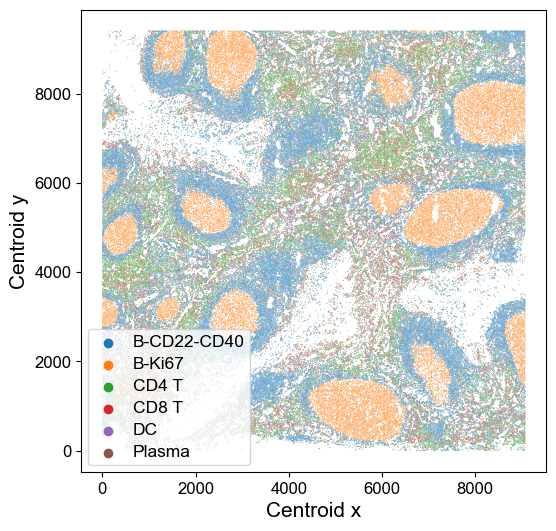

In [18]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein, x="centroid_x", y="centroid_y", 
                hue="cluster.term", s = 0.3, rasterized=True,
               hue_order = cell_type_order)#,
               #palette="muted")
plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)
plt.show()

### Average protein expression

In [19]:
# k-means clustering on avg_exp_df
n_cluster = 10
kmeans_protein = KMeans(n_clusters=n_cluster, random_state=0).fit(avg_exp_df)
protein['cluster_protein'] = kmeans_protein.labels_.astype(str)

/Users/daisyding/opt/miniconda3/envs/omics/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [20]:
order_clusters_protein = sorted(protein['cluster_protein'].unique())

In [21]:
protein['cluster_protein_order'] = protein['cluster_protein']
index1 = protein[protein['cluster_protein_order'] == '1'].index
index2 = protein[protein['cluster_protein_order'] == '9'].index
protein.loc[index1, 'cluster_protein_order'] = '9'
protein.loc[index2, 'cluster_protein_order'] = '1'

index3 = protein[protein['cluster_protein_order'] == '7'].index
index4 = protein[protein['cluster_protein_order'] == '2'].index
protein.loc[index3, 'cluster_protein_order'] = '2'
protein.loc[index4, 'cluster_protein_order'] = '7'

index5 = protein[protein['cluster_protein_order'] == '0'].index
index6 = protein[protein['cluster_protein_order'] == '5'].index
protein.loc[index5, 'cluster_protein_order'] = '5'
protein.loc[index6, 'cluster_protein_order'] = '0'

index7 = protein[protein['cluster_protein_order'] == '2'].index
index8 = protein[protein['cluster_protein_order'] == '9'].index
protein.loc[index7, 'cluster_protein_order'] = '9'
protein.loc[index8, 'cluster_protein_order'] = '2'

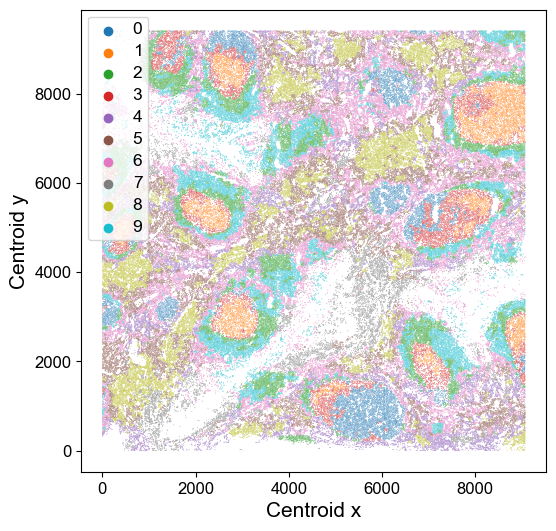

In [22]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein, x="centroid_x", y="centroid_y", hue="cluster_protein_order", 
                hue_order=order_clusters_protein, s=0.3, rasterized=True)#,
                #palette="bright")

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='upper left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)
plt.show()

### Average RNA expression

In [23]:
n_cluster = 10
kmeans_rna = KMeans(n_clusters=n_cluster, random_state=0).fit(avg_exp_rna_df)
protein['cluster_rna'] = kmeans_rna.labels_.astype(str)

/Users/daisyding/opt/miniconda3/envs/omics/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [24]:
order_clusters_rna = sorted(protein['cluster_rna'].unique())
protein['cluster_rna_order'] = protein['cluster_rna']

index1 = protein[protein['cluster_rna_order'] == '1'].index
index2 = protein[protein['cluster_rna_order'] == '8'].index

protein.loc[index1, 'cluster_rna_order'] = '8' 
protein.loc[index2, 'cluster_rna_order'] = '1' 

index3 = protein[protein['cluster_rna_order'] == '2'].index
index4 = protein[protein['cluster_rna_order'] == '3'].index

protein.loc[index3, 'cluster_rna_order'] = '3' 
protein.loc[index4, 'cluster_rna_order'] = '2'

index5 = protein[protein['cluster_rna_order'] == '2'].index
index6 = protein[protein['cluster_rna_order'] == '4'].index

protein.loc[index5, 'cluster_rna_order'] = '4' 
protein.loc[index6, 'cluster_rna_order'] = '2' 

index7 = protein[protein['cluster_rna_order'] == '5'].index
index8 = protein[protein['cluster_rna_order'] == '0'].index

protein.loc[index7, 'cluster_rna_order'] = '0' 
protein.loc[index8, 'cluster_rna_order'] = '5' 

index9 = protein[protein['cluster_rna_order'] == '4'].index
index10 = protein[protein['cluster_rna_order'] == '8'].index

protein.loc[index9, 'cluster_rna_order'] = '8' 
protein.loc[index10, 'cluster_rna_order'] = '4' 

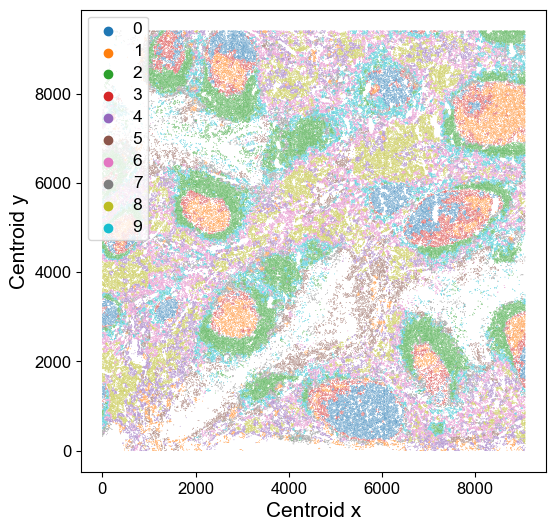

In [25]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein, x="centroid_x", y="centroid_y", hue="cluster_rna_order", 
                hue_order=order_clusters_protein, s=0.3, rasterized=True)#,
                #palette="bright")

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='upper left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

#plt.savefig('../figures/tonsil/tonsil_avgrna_order.png')
#plt.savefig('../figures/tonsil/tonsil_avgrna_order.svg', dpi=300)
plt.show()

### Average Protein + RNA expression

In [45]:
avg_exp_comb_df = np.hstack((avg_exp_df, avg_exp_rna_df))

In [37]:
n_cluster = 10
kmeans_comb = KMeans(n_clusters=n_cluster, random_state=0).fit(avg_exp_comb_df)
protein['cluster_combine'] = kmeans_comb.labels_.astype(str)

/Users/daisyding/opt/miniconda3/envs/omics/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


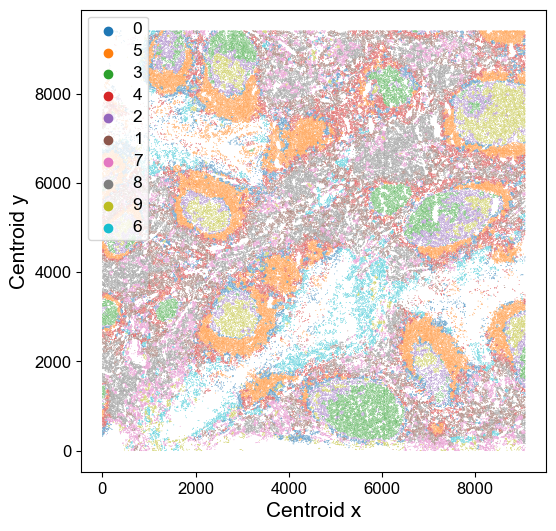

In [38]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein, x="centroid_x", y="centroid_y", hue="cluster_combine", 
                s=0.3, rasterized=True)#,
                #palette="bright")

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='upper left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)
    
plt.show()

# Leidan Clustering

### Cellular composition

In [26]:
adata_cell_composition_raw = sc.AnnData(X=cell_nbhd)
adata_cell_composition = adata_cell_composition_raw
# Can change the number of neighbors here
sc.pp.neighbors(adata_cell_composition, 100, metric='cosine')

/var/folders/p9/l9_cp9p96kg_0zk6v9v47ly00000gn/T/ipykernel_54682/1668032404.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata_cell_composition_raw = sc.AnnData(X=cell_nbhd)
/Users/daisyding/opt/miniconda3/envs/omics/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [27]:
# Can change resolution here
sc.tl.leiden(adata_cell_composition, resolution=0.001)
len(np.unique(adata_cell_composition.obs['leiden']))

76

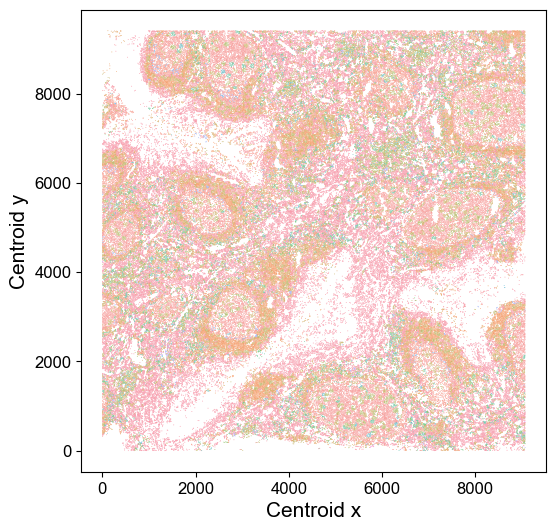

In [28]:
protein['cluster_cell_leiden'] = adata_cell_composition.obs['leiden'].values

# Plot the clusters
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein, x="centroid_x", y="centroid_y", 
                hue="cluster_cell_leiden", 
                s=0.3, rasterized=True, legend=False)  # , palette="bright"

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

#legend = plt.legend(title='', loc='upper left')
#legend.get_title().set_fontsize('0') 
#for label in legend.get_texts():
#    label.set_fontsize(12.5)

plt.show()

/Users/daisyding/opt/miniconda3/envs/omics/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


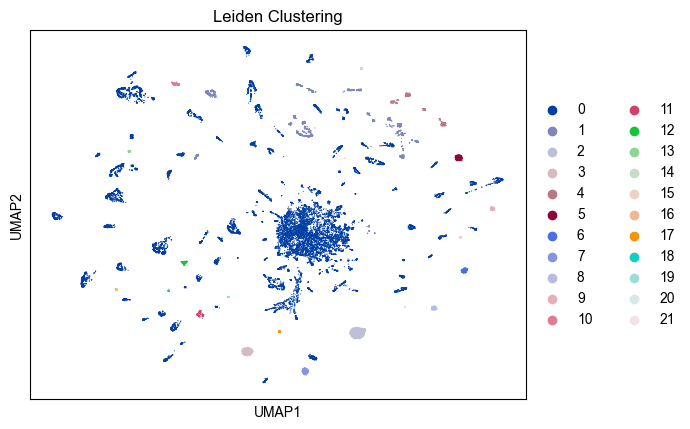

In [30]:
# Subsample for UMAP
adata_cell_composition_sample = adata_cell_composition_raw[adata_cell_composition_raw.obs.sample(n=50000, random_state=3).index]
sc.pp.neighbors(adata_cell_composition_sample, 100, metric='cosine')
sc.tl.leiden(adata_cell_composition_sample, resolution=0.001)
sc.tl.umap(adata_cell_composition_sample)
sc.pl.umap(adata_cell_composition_sample, color='leiden', title='Leiden Clustering')

### Protein expression

In [37]:
adata_protein_raw = sc.AnnData(X=avg_exp_df)
adata_protein = adata_protein_raw
sc.pp.neighbors(adata_protein, 30, metric='cosine')

/var/folders/p9/l9_cp9p96kg_0zk6v9v47ly00000gn/T/ipykernel_54682/2979988875.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata_protein_raw = sc.AnnData(X=avg_exp_df)


In [38]:
sc.tl.leiden(adata_protein, resolution=0.05)
len(np.unique(adata_protein.obs['leiden']))

9

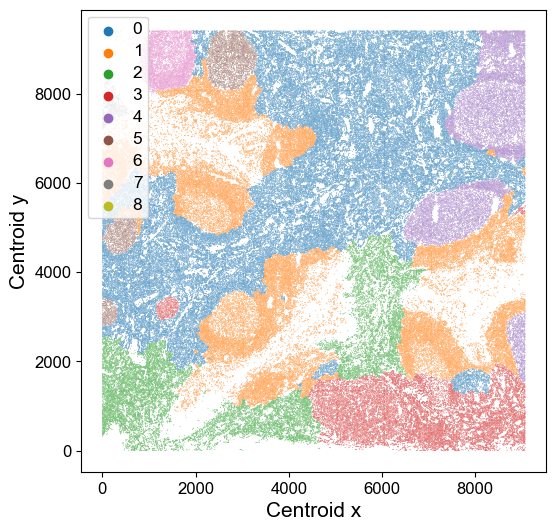

In [39]:
protein['cluster_protein_leiden'] = adata_protein.obs['leiden'].values

# Plot the clusters
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein, x="centroid_x", y="centroid_y", 
                hue="cluster_protein_leiden", 
                s=0.3, rasterized=True)  # , palette="bright"

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='upper left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

plt.show()

/Users/daisyding/opt/miniconda3/envs/omics/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


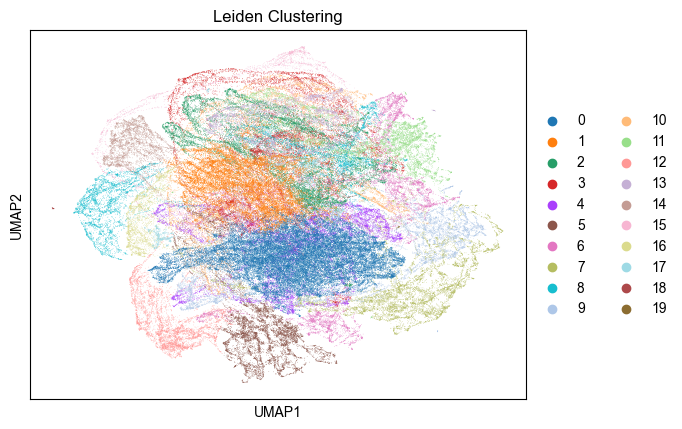

In [18]:
sc.tl.umap(adata_protein)
sc.pl.umap(adata_protein, color='leiden', title='Leiden Clustering')

### RNA expression

In [40]:
adata_rna_raw = sc.AnnData(X=avg_exp_rna_df)
adata_rna = adata_rna_raw
sc.pp.neighbors(adata_rna, 20, metric='cosine')

/var/folders/p9/l9_cp9p96kg_0zk6v9v47ly00000gn/T/ipykernel_54682/779376879.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata_rna_raw = sc.AnnData(X=avg_exp_rna_df)


         Falling back to preprocessing with `sc.pp.pca` and default params.


In [41]:
sc.tl.leiden(adata_rna, resolution=0.3)
len(np.unique(adata_rna.obs['leiden']))

12

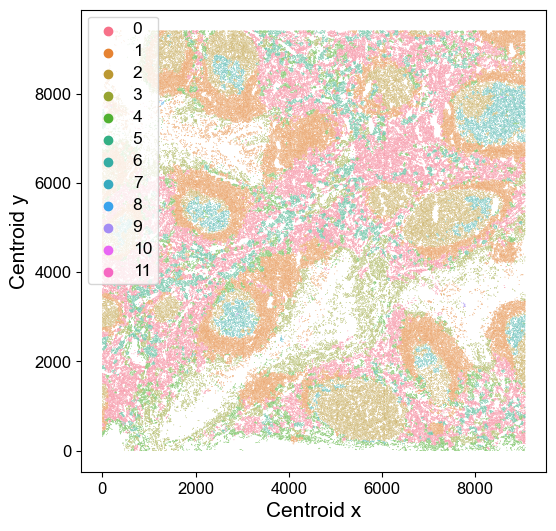

In [42]:
protein['cluster_rna_leiden'] = adata_rna.obs['leiden'].values

# Plot the clusters
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein, x="centroid_x", y="centroid_y", 
                hue="cluster_rna_leiden", 
                s=0.3, rasterized=True)  # , palette="bright"

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='upper left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

plt.show()

### Protein + RNA expression

In [46]:
adata_comb_raw = sc.AnnData(X=avg_exp_comb_df)
adata_comb = adata_comb_raw
sc.pp.neighbors(adata_comb, 20, metric='cosine')

/var/folders/p9/l9_cp9p96kg_0zk6v9v47ly00000gn/T/ipykernel_54682/2391242346.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata_comb_raw = sc.AnnData(X=avg_exp_comb_df)


         Falling back to preprocessing with `sc.pp.pca` and default params.


In [47]:
sc.tl.leiden(adata_comb, resolution=0.3)
len(np.unique(adata_comb.obs['leiden']))

13

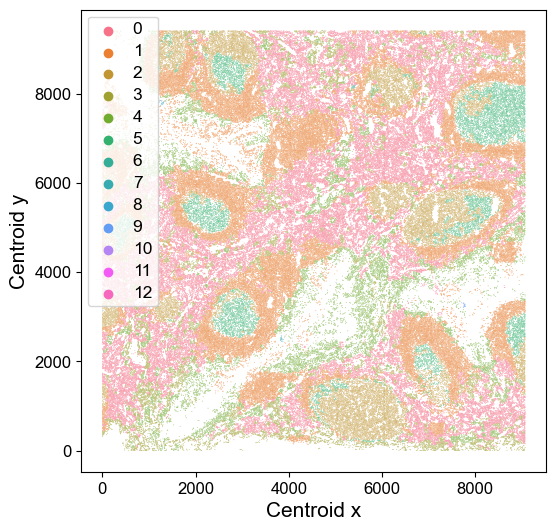

In [48]:
protein['cluster_comb_leiden'] = adata_comb.obs['leiden'].values

# Plot the clusters
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein, x="centroid_x", y="centroid_y", 
                hue="cluster_comb_leiden", 
                s=0.3, rasterized=True)  # , palette="bright"

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='upper left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

plt.show()

# Hierarchical Clustering 

In [66]:
# Subsample for hierarchical clustering for now
indices_subsample = np.random.choice(cell_nbhd.shape[0], 30000, replace=False)
cell_nbhd_sample = cell_nbhd[indices_subsample]
protein_sample = avg_exp_df[indices_subsample]
rna_sample = avg_exp_rna_df[indices_subsample]
comb_sample = avg_exp_comb_df[indices_subsample]

In [67]:
cell_hclust = cell_nbhd_sample
protein_hclust = protein_sample
rna_hclust = rna_sample
comb_hclust = comb_sample

### Cellular composition

In [68]:
# hierarchical clustering on cell_nbhd
n_clusters = 10
hc = AgglomerativeClustering(n_clusters=n_clusters, affinity='cosine', linkage='complete')
hc.fit(cell_hclust)

/Users/daisyding/opt/miniconda3/envs/omics/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


AgglomerativeClustering(affinity='cosine', linkage='complete', n_clusters=10)

/var/folders/p9/l9_cp9p96kg_0zk6v9v47ly00000gn/T/ipykernel_54682/1835075414.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  protein_subsample['cluster_composition_hc'] = hc.labels_.astype(str)


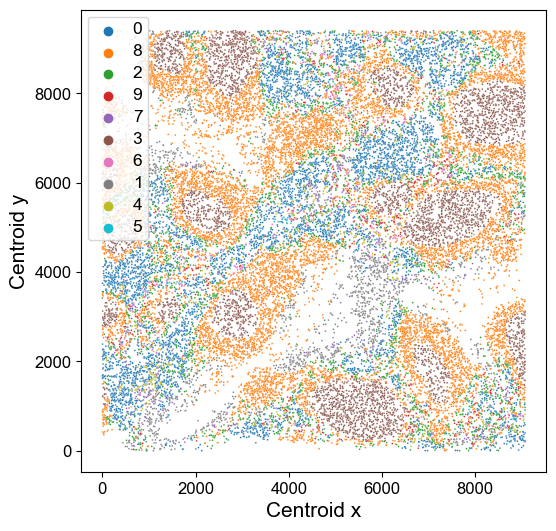

In [74]:
protein_subsample = protein.iloc[indices_subsample]

# Assign cluster labels to the protein DataFrame
protein_subsample['cluster_composition_hc'] = hc.labels_.astype(str)

# Plot the clusters
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein_subsample, x="centroid_x", y="centroid_y", 
                hue="cluster_composition_hc", 
                s=1.5, rasterized=True)  # , palette="bright"

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='upper left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

plt.show()

### Protein expression

In [75]:
# hierarchical clustering on cell_nbhd
n_clusters = 10
hc_protein = AgglomerativeClustering(n_clusters=n_clusters, affinity='cosine', linkage='complete')
hc_protein.fit(protein_hclust)

/Users/daisyding/opt/miniconda3/envs/omics/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


AgglomerativeClustering(affinity='cosine', linkage='complete', n_clusters=10)

/var/folders/p9/l9_cp9p96kg_0zk6v9v47ly00000gn/T/ipykernel_54682/3461174056.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  protein_subsample['cluster_protein_hc'] = hc_protein.labels_.astype(str)


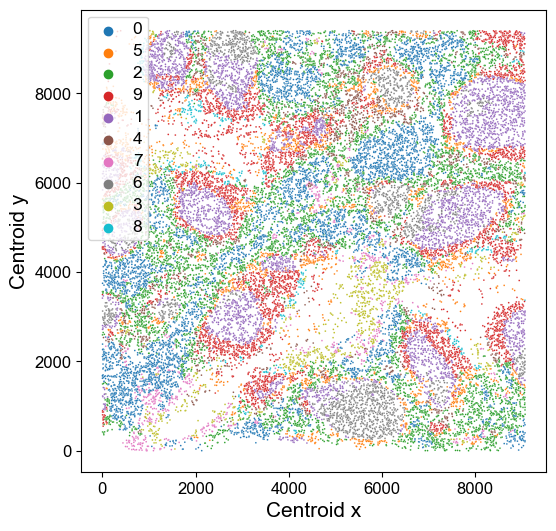

In [76]:
# Assign cluster labels to the protein DataFrame
protein_subsample['cluster_protein_hc'] = hc_protein.labels_.astype(str)

# Plot the clusters
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein_subsample, x="centroid_x", y="centroid_y", 
                hue="cluster_protein_hc", 
                s=1.5, rasterized=True)  # , palette="bright"

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='upper left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

plt.show()

### RNA expression

In [78]:
# hierarchical clustering on cell_nbhd
n_clusters = 10
# NEED TO CHANGE COSINE TO EUCLIDEAN HERE FOR RNA
hc_rna = AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean', linkage='complete')
hc_rna.fit(rna_hclust)

/Users/daisyding/opt/miniconda3/envs/omics/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


AgglomerativeClustering(affinity='euclidean', linkage='complete', n_clusters=10)

/var/folders/p9/l9_cp9p96kg_0zk6v9v47ly00000gn/T/ipykernel_54682/101110736.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  protein_subsample['cluster_rna_hc'] = hc_rna.labels_.astype(str)


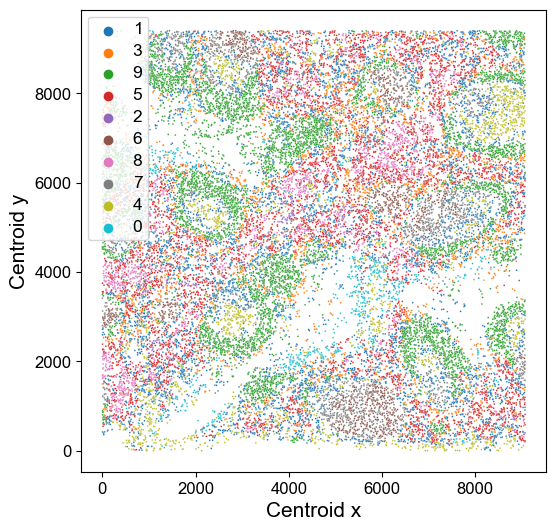

In [79]:
# Assign cluster labels to the protein DataFrame
protein_subsample['cluster_rna_hc'] = hc_rna.labels_.astype(str)

# Plot the clusters
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein_subsample, x="centroid_x", y="centroid_y", 
                hue="cluster_rna_hc", 
                s=1.5, rasterized=True)  # , palette="bright"

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='upper left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

plt.show()

### Protein + RNA expression

In [99]:
# hierarchical clustering on cell_nbhd
n_clusters = 10
# NEED TO CHANGE COSINE TO EUCLIDEAN HERE FOR RNA
hc_comb = AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean', linkage='complete')
hc_comb.fit(comb_hclust)

/Users/daisyding/opt/miniconda3/envs/omics/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


AgglomerativeClustering(affinity='euclidean', linkage='complete', n_clusters=10)

/var/folders/p9/l9_cp9p96kg_0zk6v9v47ly00000gn/T/ipykernel_54682/291686983.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  protein_subsample['cluster_comb_hc'] = hc_comb.labels_.astype(str)


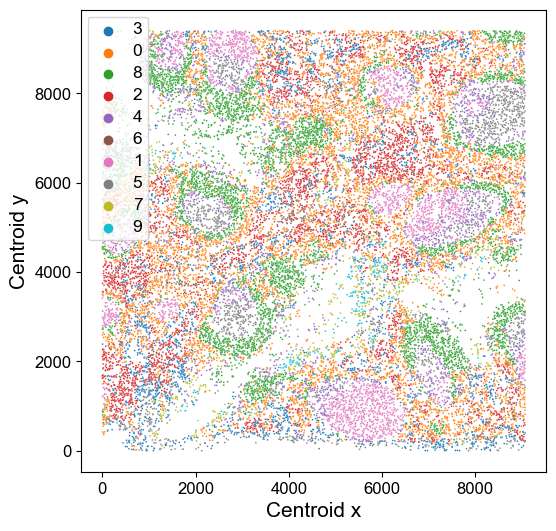

In [100]:
# Assign cluster labels to the protein DataFrame
protein_subsample['cluster_comb_hc'] = hc_comb.labels_.astype(str)

# Plot the clusters
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein_subsample, x="centroid_x", y="centroid_y", 
                hue="cluster_comb_hc", 
                s=1.5, rasterized=True)  # , palette="bright"

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='upper left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

plt.show()

# Louvain Clustering

### Cellular composition

In [80]:
# Can change resolution here
sc.tl.louvain(adata_cell_composition, resolution=0.001)
len(np.unique(adata_cell_composition.obs['louvain']))

31

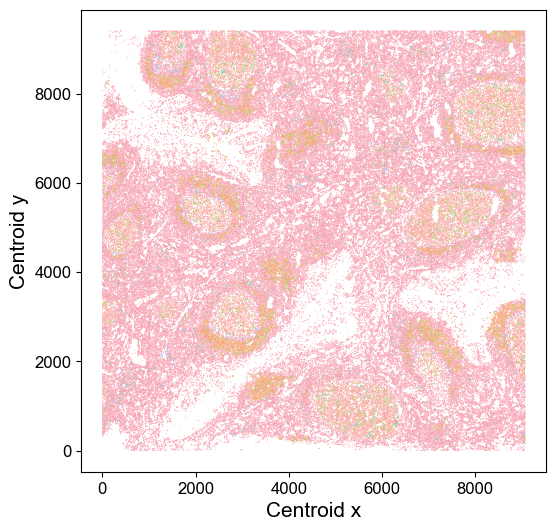

In [81]:
protein['cluster_cell_louvain'] = adata_cell_composition.obs['louvain'].values

# Plot the clusters
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein, x="centroid_x", y="centroid_y", 
                hue="cluster_cell_louvain", 
                s=0.3, rasterized=True, legend=False)  # , palette="bright"

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

#legend = plt.legend(title='', loc='upper left')
#legend.get_title().set_fontsize('0') 
#for label in legend.get_texts():
#    label.set_fontsize(12.5)

plt.show()

### Protein expression

In [93]:
# Can change resolution here
sc.tl.louvain(adata_protein, resolution=0.3)
len(np.unique(adata_protein.obs['louvain']))

12

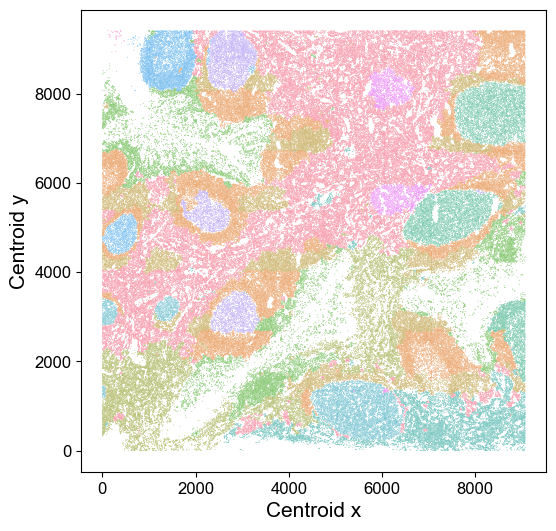

In [94]:
protein['cluster_protein_louvain'] = adata_protein.obs['louvain'].values

# Plot the clusters
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein, x="centroid_x", y="centroid_y", 
                hue="cluster_protein_louvain", 
                s=0.3, rasterized=True, legend=False)  # , palette="bright"

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

#legend = plt.legend(title='', loc='upper left')
#legend.get_title().set_fontsize('0') 
#for label in legend.get_texts():
#    label.set_fontsize(12.5)

plt.show()

### RNA expression

In [95]:
# Can change resolution here
sc.tl.louvain(adata_rna, resolution=0.3)
len(np.unique(adata_rna.obs['louvain']))

6

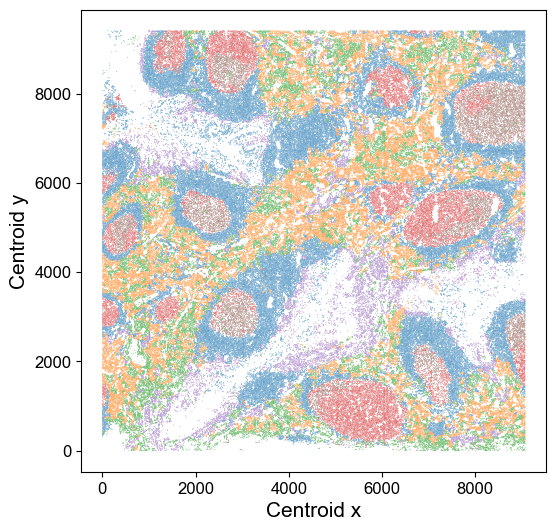

In [96]:
protein['cluster_rna_louvain'] = adata_rna.obs['louvain'].values

# Plot the clusters
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein, x="centroid_x", y="centroid_y", 
                hue="cluster_rna_louvain", 
                s=0.3, rasterized=True, legend=False)  # , palette="bright"

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

#legend = plt.legend(title='', loc='upper left')
#legend.get_title().set_fontsize('0') 
#for label in legend.get_texts():
#    label.set_fontsize(12.5)

plt.show()

### Protein + RNA expression

In [97]:
# Can change resolution here
sc.tl.louvain(adata_comb, resolution=0.3)
len(np.unique(adata_comb.obs['louvain']))

6

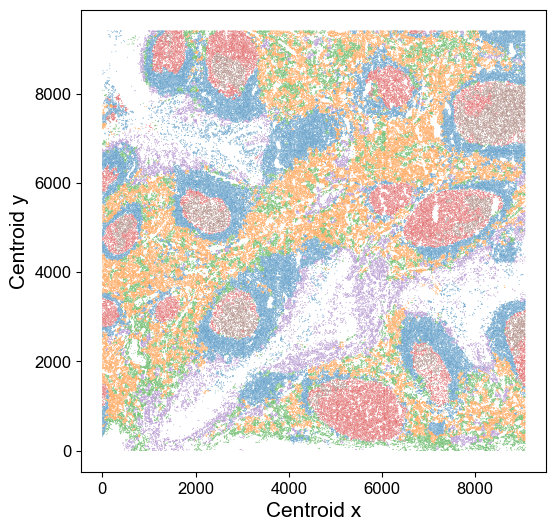

In [98]:
protein['cluster_comb_louvain'] = adata_comb.obs['louvain'].values

# Plot the clusters
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein, x="centroid_x", y="centroid_y", 
                hue="cluster_comb_louvain", 
                s=0.3, rasterized=True, legend=False)  # , palette="bright"

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

#legend = plt.legend(title='', loc='upper left')
#legend.get_title().set_fontsize('0') 
#for label in legend.get_texts():
#    label.set_fontsize(12.5)

plt.show()

# Previous notebook: Patch Visualization

In [82]:
import matplotlib.patches as patches

In [83]:
protein_region = protein.loc[protein['reg'] == '1',:]
patches_coordinates = msd.generate_patches(protein_region,
                                           'reg',
                                           '1', 
                                           scaling_factor=4., 
                                           spatial_key=['centroid_x','centroid_y'])

In [87]:
patch_id = 9 # patch id for visualisation
example_patch =  patches_coordinates[patch_id]
custom_patch = [(1500,7200,3700,9400)]
print(custom_patch)
protein_patch = protein_region[
                (protein_region["centroid_x"] >= custom_patch[0][0]) &#example_patch[0]) &
                (protein_region["centroid_x"] < custom_patch[0][2]) & #example_patch[2]) &
                (protein_region["centroid_y"] >= custom_patch[0][1]) &#example_patch[1]) &
                (protein_region["centroid_y"] < custom_patch[0][3]) #example_patch[3])
            ]

[(1500, 7200, 3700, 9400)]


In [49]:
patch_id = 9 # patch id for visualisation
example_patch =  patches_coordinates[patch_id]
print(example_patch)
protein_patch = protein_region[
                (protein_region["centroid_x"] >= 1500) &#example_patch[0]) &
                (protein_region["centroid_x"] < 3700) & #example_patch[2]) &
                (protein_region["centroid_y"] >= 7200) &#example_patch[1]) &
                (protein_region["centroid_y"] < 9400) #example_patch[3])
            ]

(2268.348847926267, 4703.754838709678, 4535.469124423962, 7054.732258064516)


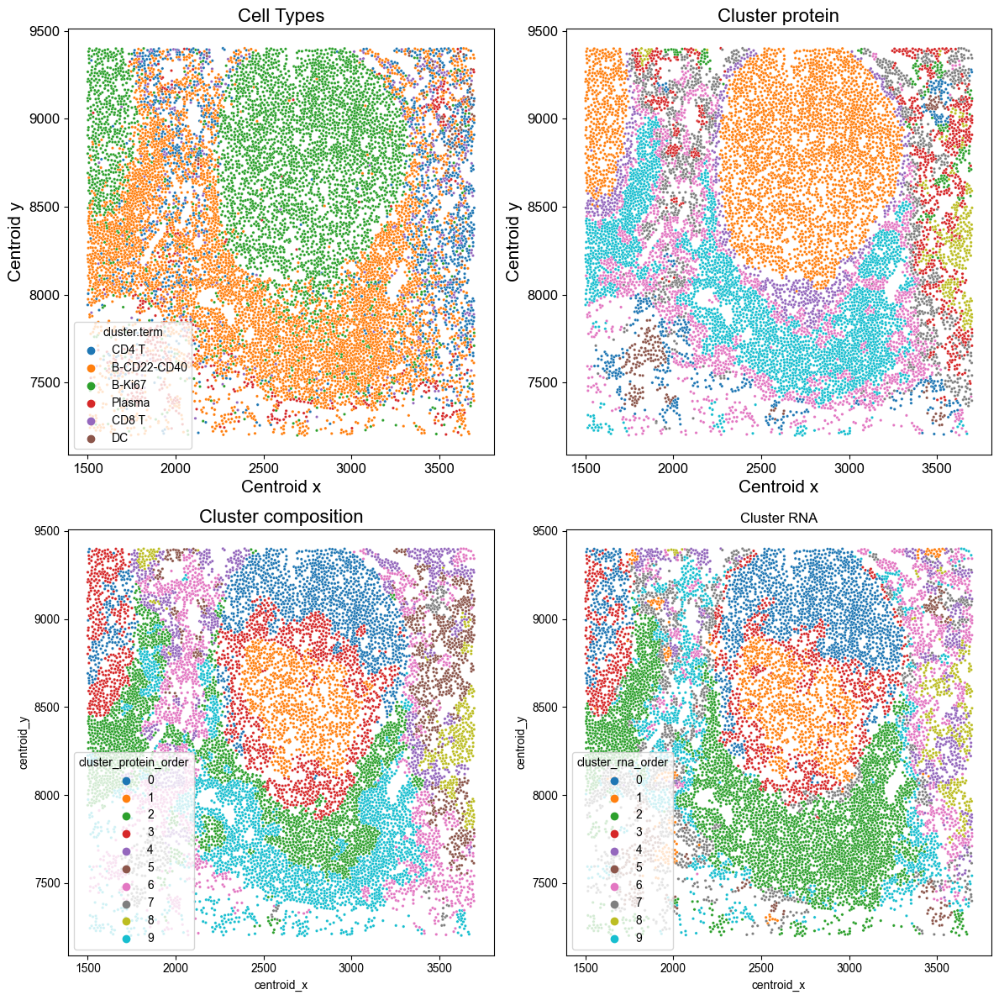

In [147]:
fig, axes = plt.subplots(2, 2, figsize=(12, 12))  # Adjusted for 2x2 subplots and figsize

sns.scatterplot(data=protein_patch, 
                x="centroid_x", 
                y="centroid_y", 
                hue="cluster.term", 
                s=6, 
                ax=axes[0, 0], 
                rasterized=True,
                legend=True)
axes[0, 0].set_title('Cell Types', fontsize=16)
axes[0, 0].tick_params(axis='x', labelsize=12)
axes[0, 0].tick_params(axis='y', labelsize=12)

axes[0, 0].set_xlabel("Centroid x", fontsize=15)
axes[0, 0].set_ylabel("Centroid y", fontsize=15)

sns.scatterplot(data=protein_patch, 
                x="centroid_x", 
                y="centroid_y", 
                hue="cluster_protein_order", 
                hue_order=order_clusters_protein,
                s=6, 
                ax=axes[1, 0], 
                rasterized=True,
                legend=True)
axes[0, 1].set_title('Cluster protein', fontsize=16)
axes[0, 1].tick_params(axis='x', labelsize=12)
axes[0, 1].tick_params(axis='y', labelsize=12)

axes[0, 1].set_xlabel("Centroid x", fontsize=15)
axes[0, 1].set_ylabel("Centroid y", fontsize=15)


sns.scatterplot(data=protein_patch, 
                x="centroid_x", 
                y="centroid_y", 
                hue="cluster_composition", 
                hue_order=order_clusters_composition, 
                s=6, 
                legend=False,
                rasterized=True,
                ax=axes[0, 1])
axes[1, 0].set_title('Cluster composition', fontsize=16)


sns.scatterplot(data=protein_patch, 
                x="centroid_x", 
                y="centroid_y", 
                hue="cluster_rna_order", 
                hue_order=order_clusters_rna,
                s=6, 
                ax=axes[1, 1], 
                rasterized=True,
                legend=True)
axes[1, 1].set_title('Cluster RNA')

plt.tight_layout()
plt.savefig('../figures/tonsil/tonsil_patch_visualisation.png')
plt.savefig('../figures/tonsil/tonsil_patch_visualisation.svg', dpi=300)
plt.show()

In [125]:
cell_type_order = sorted(protein['cluster.term'].unique())

In [126]:
cell_type_order

['B-CD22-CD40', 'B-Ki67', 'CD4 T', 'CD8 T', 'DC', 'Plasma']

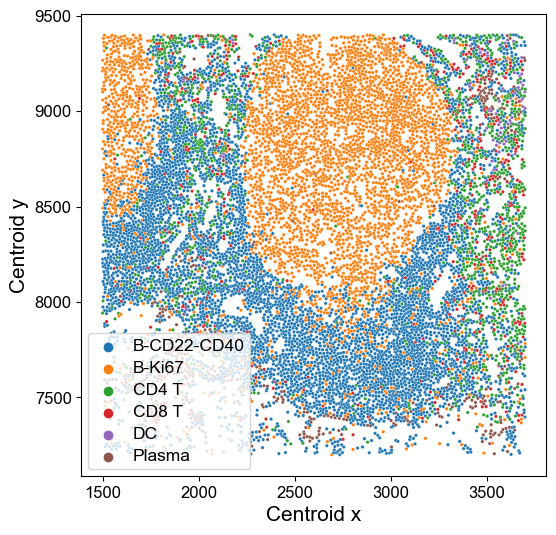

In [145]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein_patch, x="centroid_x", y="centroid_y", 
                hue="cluster.term", s = 6, rasterized=True,
               hue_order=cell_type_order)#,
               #palette="muted")
plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

plt.savefig('../figures/tonsil/tonsil_celltype_patch.png')
plt.savefig('../figures/tonsil/tonsil_celltype_patch.svg', dpi=300)
plt.show()

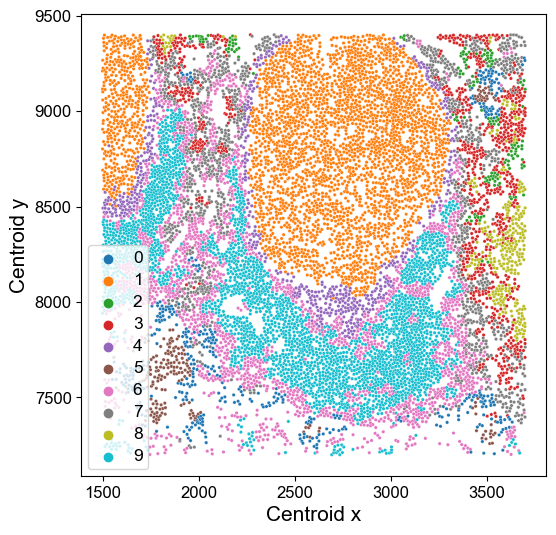

In [149]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein_patch, x="centroid_x", y="centroid_y", hue="cluster_composition", 
                hue_order=order_clusters_composition, s =6, rasterized=True)#,
               #palette="muted")

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

plt.savefig('../figures/tonsil/tonsil_ct_composition_patch.png')
plt.savefig('../figures/tonsil/tonsil_ct_composition_patch.svg', dpi=300)
plt.show()

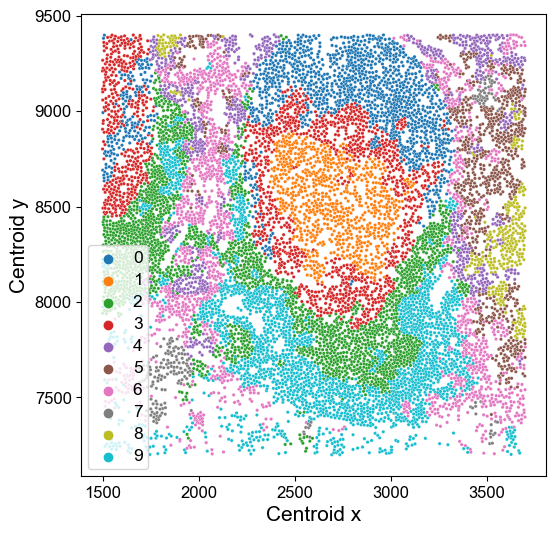

In [151]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein_patch, x="centroid_x", y="centroid_y", hue="cluster_protein_order", 
                hue_order=order_clusters_protein, s=6, rasterized=True)#,
                #palette="bright")

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

plt.savefig('../figures/tonsil/tonsil_avgprotein_order_patch.png')
plt.savefig('../figures/tonsil/tonsil_avgprotein_order_patch.svg', dpi=300)
plt.show()

# Emphasize Germinal Center Neighborhoods

In [76]:
default_palette = sns.color_palette()
for i, color in enumerate(default_palette[:10]):
    hex_color = "#{:02x}{:02x}{:02x}".format(int(color[0] * 255), int(color[1] * 255), int(color[2] * 255))
    print(f"Color {i}: {hex_color}")

Color 0: #1f77b4
Color 1: #ff7f0e
Color 2: #2ca02c
Color 3: #d62728
Color 4: #9467bd
Color 5: #8c564b
Color 6: #e377c2
Color 7: #7f7f7f
Color 8: #bcbd22
Color 9: #17becf


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


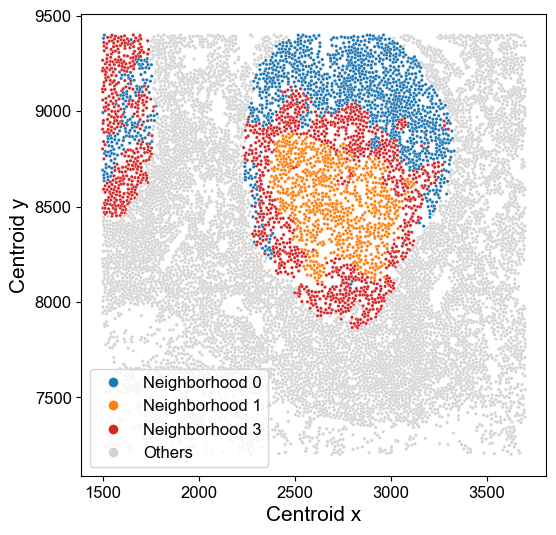

In [81]:
plt.figure(figsize=(6, 6))

protein_color_map = {'0': 'blue', '1': 'orange', '3': 'red'}
cluster_colors = [protein_color_map[val] if val in protein_color_map 
                  else 'gray' for val in np.array(protein_patch['cluster_protein_order'])]

#protein_color_map = {'0': 'blue', '1': 'orange', '3': 'red'}
#default_color = 'gray'
protein_color_map = {'0': '#1f77b4', '1': '#ff7f0e', '3': '#d62728'}
default_color = '#D3D3D3'

# Get cluster colors from the numpy array
cluster_colors = [protein_color_map.get(val, default_color) for val in np.array(protein_patch['cluster_protein_order'])]


sns.scatterplot(data=protein_patch, x="centroid_x", y="centroid_y", color=cluster_colors, #hue = cluster_colors,
                s=6, rasterized=True)

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)
    
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=8, label=f'Neighborhood {val}')
           for val, color in protein_color_map.items()]
handles.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=default_color, markersize=8, label='Others'))

plt.legend(handles=handles, title='', loc='lower left', fontsize=12)

plt.savefig('../figures/tonsil/tonsil_avgprotein_order_patch_contrast.png')
plt.savefig('../figures/tonsil/tonsil_avgprotein_order_patch_contrast.svg', dpi=300)
plt.show()

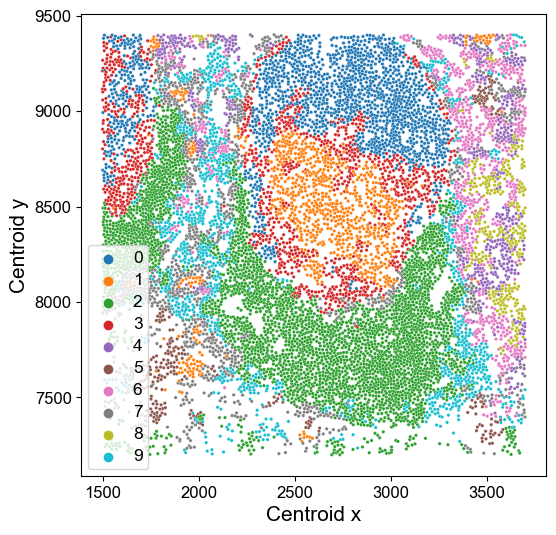

In [152]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein_patch, x="centroid_x", y="centroid_y", hue="cluster_rna_order", 
                hue_order=order_clusters_protein, s=6, rasterized=True)#,
                #palette="bright")

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

plt.savefig('../figures/tonsil/tonsil_avgrna_order_patch.png')
plt.savefig('../figures/tonsil/tonsil_avgrna_order_patch.svg', dpi=300)
plt.show()

In [91]:
patch_indices, patch_comp = msd.calculate_heterogeneity_index(spatial_data=protein, 
                                                  library_key='reg', 
                                                  library_id='1', 
                                                  spatial_key=['centroid_x','centroid_y'], 
                                                  patches=patches_coordinates, 
                                                  cluster_key='cluster_protein', 
                                                  metric='Shannon Diversity', return_comp=True)


# Visualize the heterogeneity indices
grid = msd.diversity_heatmap(spatial_data=protein_region,
                             library_key='reg',
                             library_id='1',
                             spatial_key=['centroid_x','centroid_y'],
                             patches=patches_coordinates, 
                             heterogeneity_indices=patch_indices,
                             plot=False)
print(grid)
print(f"Patch {patch_id} has entropy of {grid.flatten()[patch_id]}")

0.000 per cent patches are empty
[[2.25353627 2.77976098 2.8851005  2.89876485]
 [2.63249571 2.87343339 2.53399064 2.39927029]
 [3.08985624 2.76256169 2.52906741 2.96203086]
 [2.57946624 3.11607316 2.52581721 2.95147478]]
Patch 9 has entropy of 2.762561687344395


In [92]:
protein.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'cellLabelInImage', 'cellSize',
       'HOECHST1', 'CD38', 'CD19', 'CD31', 'Vimentin', 'CD22', 'Ki67', 'CD8',
       'CD90', 'CD123', 'CD15', 'CD3', 'CD152', 'CD21', 'cytokeratin', 'CD2',
       'CD66', 'collagen IV', 'CD81', 'HLA-DR', 'CD57', 'CD4', 'CD7', 'CD278',
       'podoplanin', 'CD45RA', 'CD34', 'CD54', 'CD9', 'IGM', 'CD117', 'CD56',
       'CD279', 'CD45', 'CD49f', 'CD5', 'CD16', 'CD63', 'CD11b', 'CD1c',
       'CD40', 'CD274', 'CD27', 'CD104', 'CD273', 'FAPalpha', 'Ecadherin',
       'PointNum', 'cluster.term', 'seurat_res1.0', 'centroid_x', 'centroid_y',
       'step', 'reg', 'cluster_composition', 'cluster_protein',
       'cluster_protein_order', 'all_protein', 'composition', 'all_rna'],
      dtype='object')

In [93]:
patch_indices, patch_comp = msd.calculate_heterogeneity_index(spatial_data=protein, 
                                                  library_key='reg', 
                                                  library_id='1', 
                                                  spatial_key=['centroid_x','centroid_y'], 
                                                  patches=custom_patch, 
                                                  cluster_key='cluster.term', 
                                                  metric='Shannon Diversity', return_comp=True)


# Visualize the heterogeneity indices
grid = msd.diversity_heatmap(spatial_data=protein_region,
                             library_key='reg',
                             library_id='1',
                             spatial_key=['centroid_x','centroid_y'],
                             patches=custom_patch, 
                             heterogeneity_indices=patch_indices,
                             plot=False)
print(grid)

0.000 per cent patches are empty
[[1.80775838]]


In [98]:
patch_indices, patch_comp = msd.calculate_heterogeneity_index(spatial_data=protein, 
                                                  library_key='reg', 
                                                  library_id='1', 
                                                  spatial_key=['centroid_x','centroid_y'], 
                                                  patches=custom_patch, 
                                                  cluster_key='cluster_composition', 
                                                  metric='Shannon Diversity', return_comp=True)


# Visualize the heterogeneity indices
grid = msd.diversity_heatmap(spatial_data=protein_region,
                             library_key='reg',
                             library_id='1',
                             spatial_key=['centroid_x','centroid_y'],
                             patches=custom_patch, 
                             heterogeneity_indices=patch_indices,
                             plot=False)
print(grid)

0.000 per cent patches are empty
[[2.75719701]]


In [99]:
patch_indices, patch_comp = msd.calculate_heterogeneity_index(spatial_data=protein, 
                                                  library_key='reg', 
                                                  library_id='1', 
                                                  spatial_key=['centroid_x','centroid_y'], 
                                                  patches=custom_patch, 
                                                  cluster_key='cluster_protein', 
                                                  metric='Shannon Diversity', return_comp=True)


# Visualize the heterogeneity indices
grid = msd.diversity_heatmap(spatial_data=protein_region,
                             library_key='reg',
                             library_id='1',
                             spatial_key=['centroid_x','centroid_y'],
                             patches=custom_patch, 
                             heterogeneity_indices=patch_indices,
                             plot=False)
print(grid)

0.000 per cent patches are empty
[[3.06540868]]


In [104]:
patch_indices, patch_comp = msd.calculate_heterogeneity_index(spatial_data=protein, 
                                                  library_key='reg', 
                                                  library_id='1', 
                                                  spatial_key=['centroid_x','centroid_y'], 
                                                  patches=custom_patch, 
                                                  cluster_key='cluster_rna', 
                                                  metric='Shannon Diversity', return_comp=True)


# Visualize the heterogeneity indices
grid = msd.diversity_heatmap(spatial_data=protein_region,
                             library_key='reg',
                             library_id='1',
                             spatial_key=['centroid_x','centroid_y'],
                             patches=custom_patch, 
                             heterogeneity_indices=patch_indices,
                             plot=False)
print(grid)

0.000 per cent patches are empty
[[2.94927777]]


# Neighborhood Heatmap

In [24]:
# calculate the average protein expression for each cluster
protein['all_protein'] = protein_exp.values.tolist()
cluster_avg_exp = protein.groupby('cluster_protein_order')['all_protein'].apply(lambda x: np.mean(x.tolist(), axis=0))
cluster_avg_exp = np.stack(cluster_avg_exp.values)
cluster_avg_exp = pd.DataFrame(cluster_avg_exp, columns=protein_features)

In [25]:
# calculate the average cellular composition based on cell_nbhd for each cluster
protein['composition'] = cell_nbhd.tolist()
cluster_composition = protein.groupby('cluster_protein_order')['composition'].apply(lambda x: np.mean(x.tolist(), axis=0))
cluster_composition = np.stack(cluster_composition.values)
cluster_composition = pd.DataFrame(cluster_composition, columns=np.unique(list(feature_labels)))

In [26]:
# scale RNA expression to 0-1 to be comparable with protein expression
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
rna_matched_protein_order_scale = scaler.fit_transform(rna_matched_protein_order)
rna_matched_protein_order_scale = pd.DataFrame(rna_matched_protein_order_scale, columns=rna_adata.var_names)

In [27]:
# calculate the average RNA expression for each cluster
protein['all_rna'] = rna_matched_protein_order_scale.values.tolist()
cluster_avg_exp_rna = protein.groupby('cluster_protein_order')['all_rna'].apply(lambda x: np.mean(x.tolist(), axis=0))
cluster_avg_exp_rna = np.stack(cluster_avg_exp_rna.values)
cluster_avg_exp_rna = pd.DataFrame(cluster_avg_exp_rna, columns=rna_matched_protein_order_scale.columns)

In [28]:
# select highly variable RNAs
var_rna = cluster_avg_exp_rna.var()
top_variance_columns = var_rna.sort_values(ascending=False).head(50)
top_variance_column_names = top_variance_columns.index.tolist()
cluster_avg_exp_rna_variable = cluster_avg_exp_rna[top_variance_column_names]

In [29]:
cluster_avg_exp_rna_variable.shape

(10, 50)

In [30]:
comb_df = pd.concat([cluster_composition, cluster_avg_exp, cluster_avg_exp_rna_variable], axis=1)

In [31]:
comb_df.shape

(10, 102)

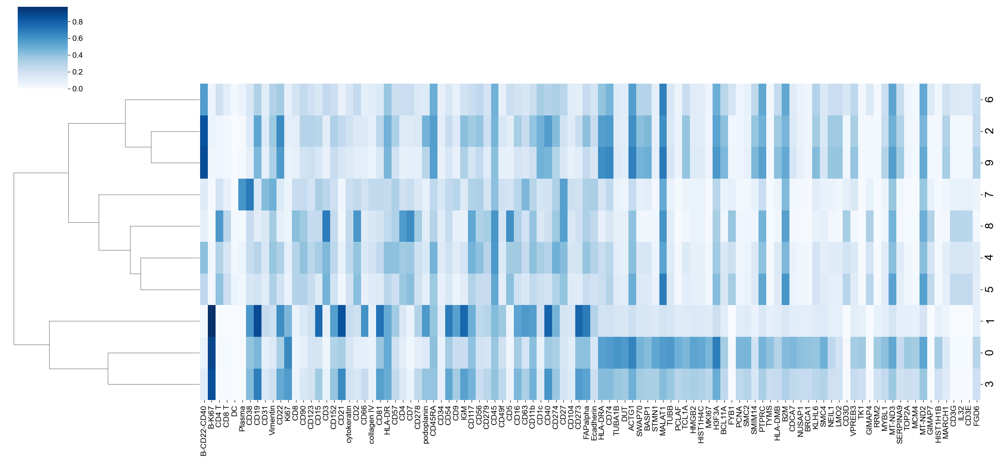

In [42]:
fg = sns.clustermap(comb_df, cmap='Blues', figsize=(22,10), 
                    row_cluster = True, 
                    col_cluster=False,
                    xticklabels=True, 
                    yticklabels=True)

fg.cax.yaxis.set_tick_params(labelsize=12.5)

fg.ax_heatmap.set_yticklabels(fg.ax_heatmap.get_yticklabels(), fontsize=18)
fg.ax_heatmap.set_xticklabels(fg.ax_heatmap.get_xticklabels(), fontsize=12.5);

plt.savefig('../figures/tonsil/tonsil_protein_neighborhood_heatmap.png')
plt.savefig('../figures/tonsil/tonsil_protein_neighborhood_heatmap.svg', dpi=300)
plt.show()